# Coffee Beans
### CS 596: Machine Learning Final Project

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns
sns.set()
style.use('ggplot')
import sklearn as sklearn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
plt.rcParams['figure.figsize'] = [18, 10]

# Import Data

In [16]:
df = pd.read_csv('../../data/processed/coffee_data_cleaned.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1311 entries, 0 to 1310
Data columns (total 44 columns):
Unnamed: 0               1311 non-null int64
Species                  1311 non-null object
Owner                    1304 non-null object
Country.of.Origin        1310 non-null object
Farm.Name                955 non-null object
Lot.Number               270 non-null object
Mill                     1001 non-null object
ICO.Number               1165 non-null object
Company                  1102 non-null object
Altitude                 1088 non-null object
Region                   1254 non-null object
Producer                 1081 non-null object
Number.of.Bags           1311 non-null int64
Bag.Weight               1311 non-null object
In.Country.Partner       1311 non-null object
Harvest.Year             1264 non-null object
Grading.Date             1311 non-null object
Owner.1                  1304 non-null object
Variety                  1110 non-null object
Processing.Method      

In [17]:
df2 = df[['Country.of.Origin','Aroma','Flavor','Aftertaste','Acidity','Body','Balance','Uniformity','Clean.Cup','Sweetness','Cupper.Points','Total.Cup.Points','Moisture','Category.One.Defects','Category.Two.Defects']]
df2.head()

,Country.of.Origin,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Clean.Cup,Sweetness,Cupper.Points,Total.Cup.Points,Moisture,Category.One.Defects,Category.Two.Defects
0,Ethiopia,8.67,8.83,8.67,8.75,8.50,8.42,10.0,10.0,10.0,8.75,90.58,0.12,0,0
1,Ethiopia,8.75,8.67,8.50,8.58,8.42,8.42,10.0,10.0,10.0,8.58,89.92,0.12,0,1
2,Guatemala,8.42,8.50,8.42,8.42,8.33,8.42,10.0,10.0,10.0,9.25,89.75,0.00,0,0
3,Ethiopia,8.17,8.58,8.42,8.42,8.50,8.25,10.0,10.0,10.0,8.67,89.00,0.11,0,2
4,Ethiopia,8.25,8.50,8.25,8.50,8.42,8.33,10.0,10.0,10.0,8.58,88.83,0.12,0,2


In [18]:
df2.shape

(1311, 15)

In [19]:
df2.describe()

,Aroma,Flavor,Aftertaste,Acidity,Body,Balance,Uniformity,Clean.Cup,Sweetness,Cupper.Points,Total.Cup.Points,Moisture,Category.One.Defects,Category.Two.Defects
count,1311.000000,1311.000000,1311.000000,1311.000000,1311.000000,1311.000000,1311.000000,1311.00000,1311.000000,1311.000000,1311.000000,1311.000000,1311.000000,1311.000000
mean,7.563806,7.518070,7.397696,7.533112,7.517727,7.517506,9.833394,9.83312,9.903272,7.497864,82.115927,0.088863,0.426392,3.591915
std,0.378666,0.399979,0.405119,0.381599,0.359213,0.406316,0.559343,0.77135,0.530832,0.474610,3.515761,0.047957,1.832415,5.350371
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.420000,7.330000,7.250000,7.330000,7.330000,7.330000,10.000000,10.00000,10.000000,7.250000,81.170000,0.090000,0.000000,0.000000
50%,7.580000,7.580000,7.420000,7.500000,7.500000,7.500000,10.000000,10.00000,10.000000,7.500000,82.500000,0.110000,0.000000,2.000000
75%,7.750000,7.750000,7.580000,7.750000,7.670000,7.750000,10.000000,10.00000,10.000000,7.750000,83.670000,0.120000,0.000000,4.000000
max,8.750000,8.830000,8.670000,8.750000,8.580000,8.750000,10.000000,10.00000,10.000000,10.000000,90.580000,0.280000,31.000000,55.000000


In [20]:
df2.isnull().sum()

Country.of.Origin       1
Aroma                   0
Flavor                  0
Aftertaste              0
Acidity                 0
Body                    0
Balance                 0
Uniformity              0
Clean.Cup               0
Sweetness               0
Cupper.Points           0
Total.Cup.Points        0
Moisture                0
Category.One.Defects    0
Category.Two.Defects    0
dtype: int64

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fa41610ba90>,
      dtype=object)

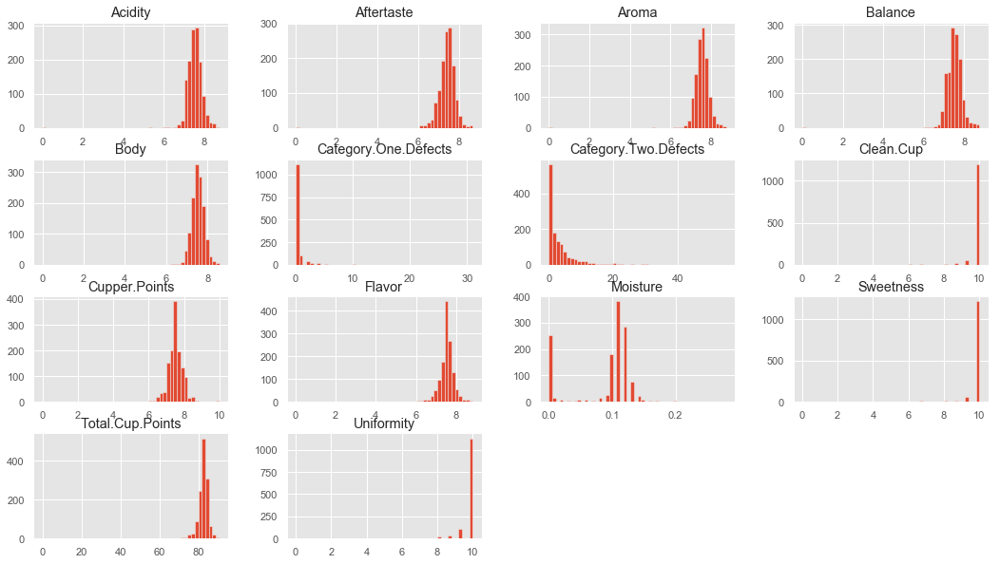

In [36]:
df2.hist(bins=50)

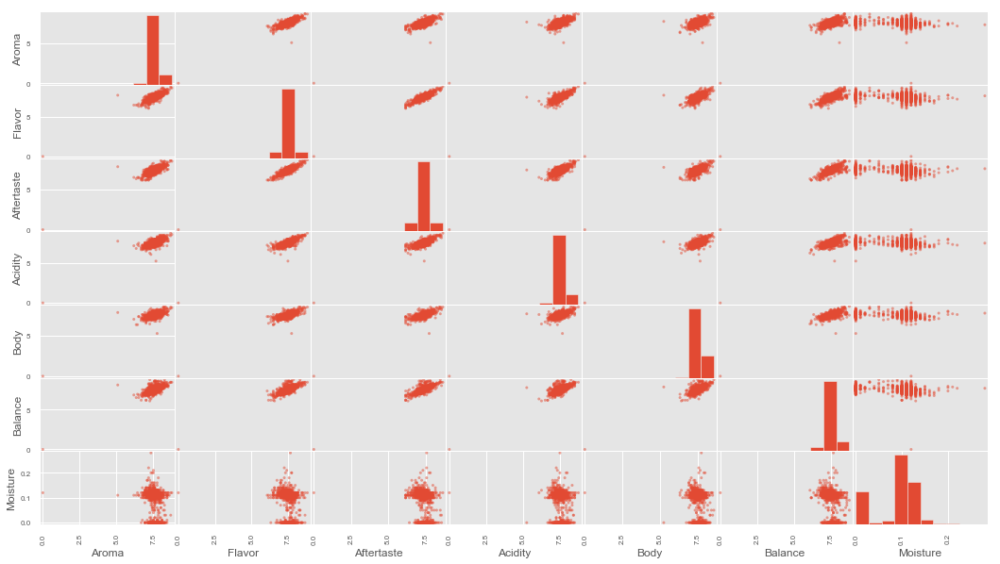

In [37]:
df3 = df[['Aroma','Flavor','Aftertaste','Acidity','Body','Balance','Moisture']]
pd.plotting.scatter_matrix(df3)
plt.show()

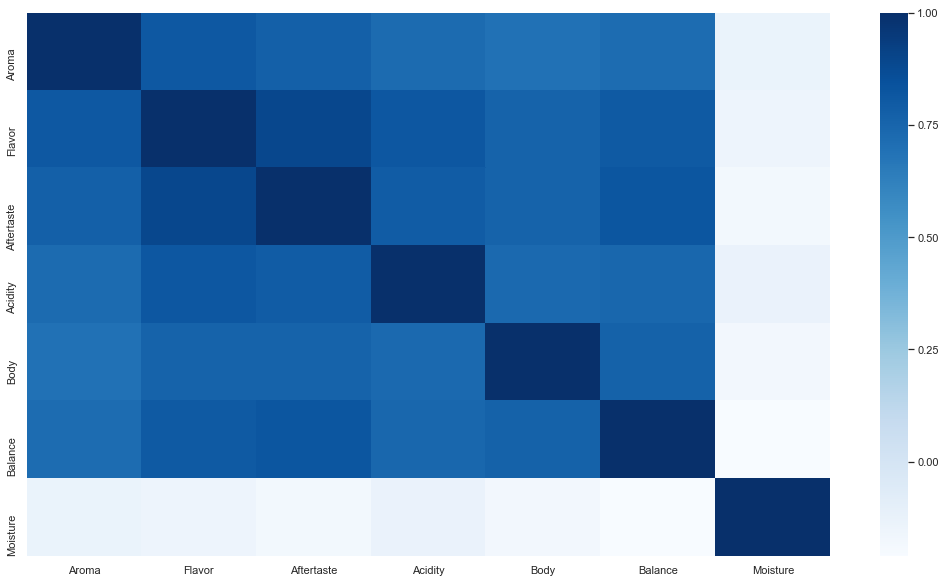

In [23]:
sns.heatmap(df3.corr(),cmap='Blues',annot=False) 

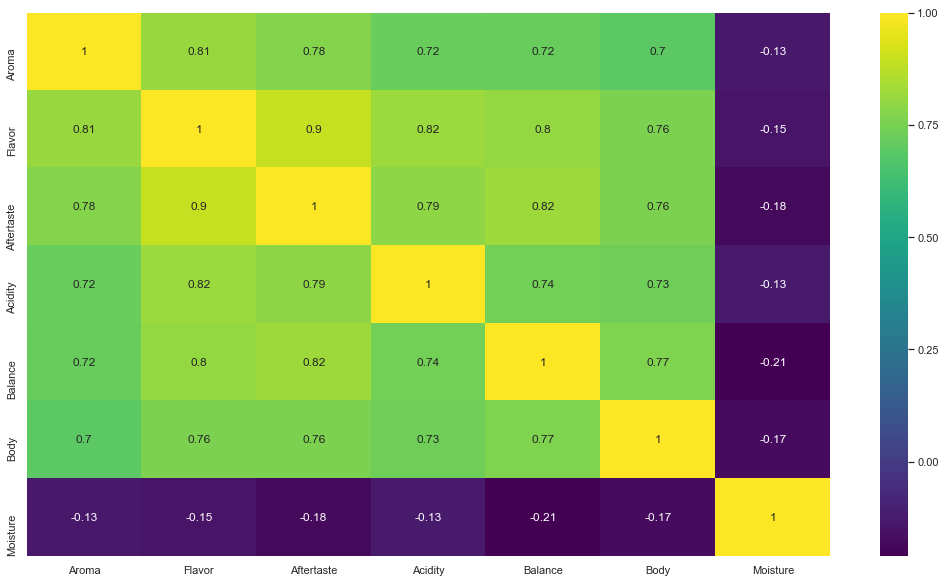

In [24]:
k = 7 #number of variables for heatmap
cols = df3.corr().nlargest(k, 'Aroma')['Aroma'].index
cm = df3[cols].corr()
sns.heatmap(cm, annot=True, cmap = 'viridis')

In [27]:
df['Country.of.Origin'].value_counts()

Mexico                          236
Colombia                        183
Guatemala                       181
Brazil                          132
Taiwan                           75
United States (Hawaii)           73
Honduras                         53
Costa Rica                       51
Ethiopia                         44
Tanzania, United Republic Of     40
Thailand                         32
Nicaragua                        26
Uganda                           26
Kenya                            25
El Salvador                      21
Indonesia                        20
China                            16
Malawi                           11
Peru                             10
United States                     8
Myanmar                           8
Vietnam                           7
Haiti                             6
Philippines                       5
Panama                            4
United States (Puerto Rico)       4
Laos                              3
Burundi                     

* Filter out countries of origin < 100 samples
* Example exploration: Mean of Flavors

Country.of.Origin
Brazil       7.573561
Colombia     7.597104
Guatemala    7.489006
Mexico       7.379025
Name: Flavor, dtype: float64

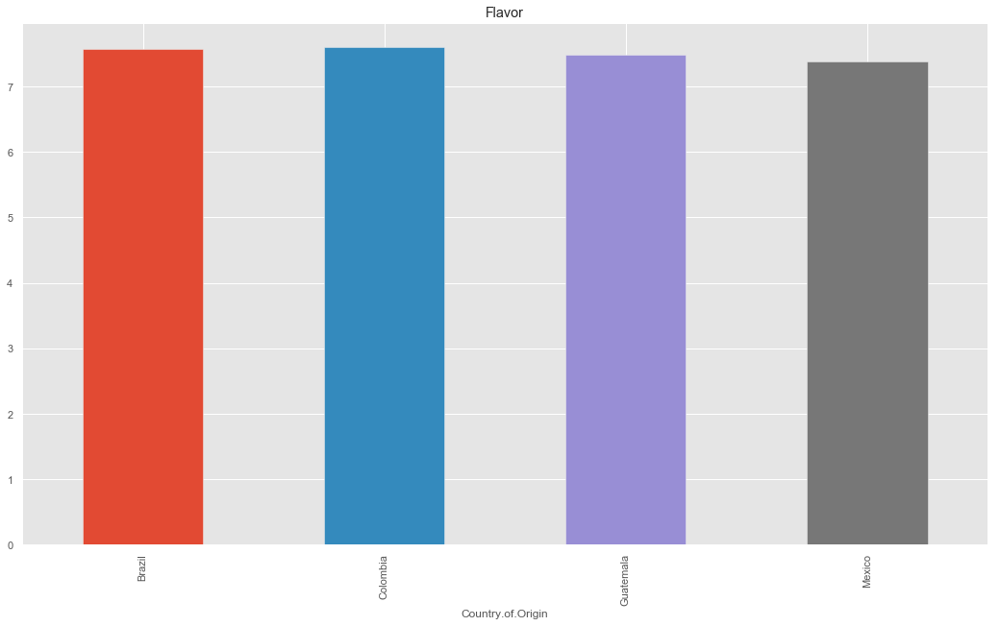

In [38]:
df4 = df[df['Country.of.Origin'].isin(['Brazil','Mexico','Guatemala','Colombia'])]
df4.groupby('Country.of.Origin')['Flavor'].mean().plot(kind='bar', title='Flavor')
df4.groupby('Country.of.Origin')['Flavor'].mean()

/home/ryantly3/Miniconda/lib/python3.7/site-packages/scipy/stats/stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


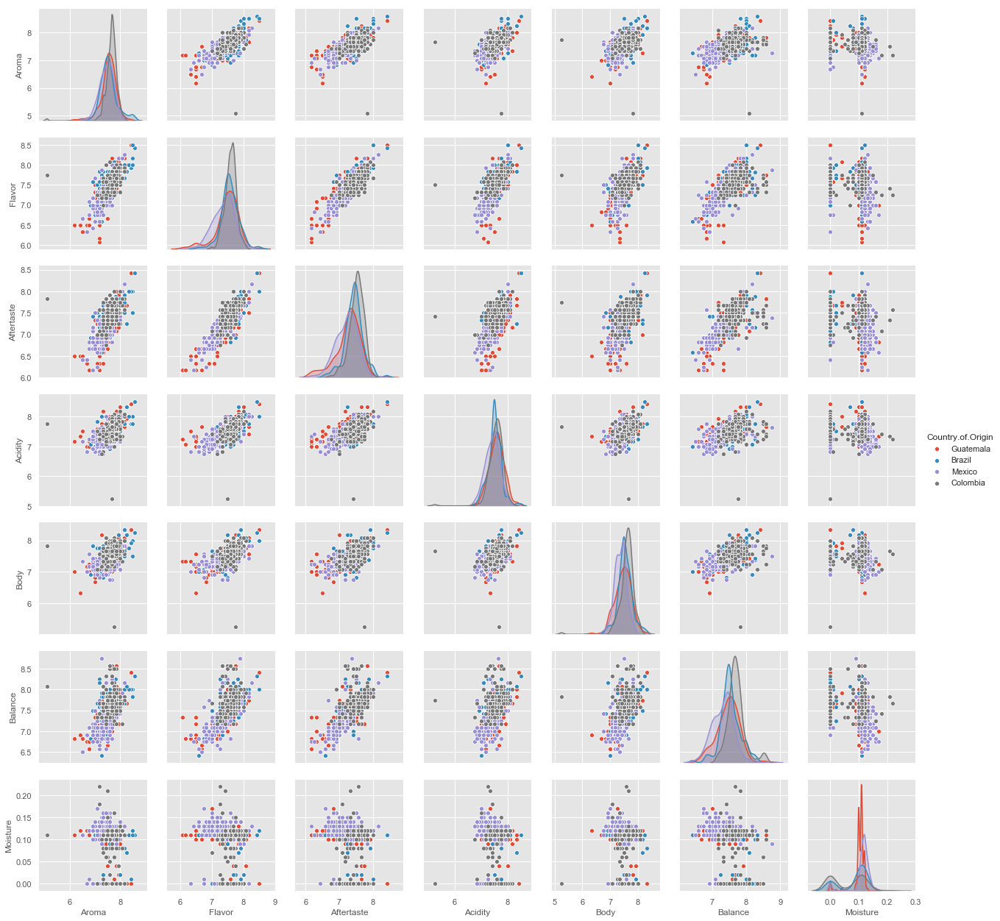

In [39]:
df5 = df4[['Aroma','Flavor','Aftertaste','Acidity','Body','Balance','Moisture','Country.of.Origin']]
sns.pairplot(df5, hue='Country.of.Origin')

/home/ryantly3/Miniconda/lib/python3.7/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Text(0.5,1,'Feature Importance in Random Forests')

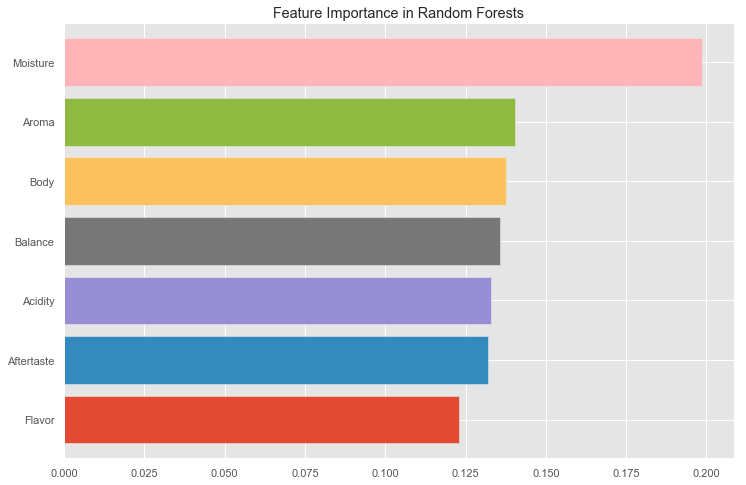

In [40]:
#Feature Importance
from sklearn.ensemble import ExtraTreesClassifier
x = df5.loc[:, df5.columns != 'Country.of.Origin']
feat_labels = x.columns
y = df5['Country.of.Origin']
clf = RandomForestClassifier()
clf.fit(x, y)
f,ax=plt.subplots(figsize=(12,8))
pd.Series(clf.feature_importances_,x.columns).sort_values(ascending=True).plot.barh(width=0.8)
ax.set_title('Feature Importance in Random Forests')

In [32]:
#split training and testing data
x = df4[['Aroma','Flavor','Aftertaste','Acidity','Body','Balance','Moisture']]
y = df4['Country.of.Origin']
#y = pd.get_dummies(y)
X_train, X_test, Y_train, Y_test = train_test_split(x, y, test_size=0.15)
sc = StandardScaler()  
X_train = sc.fit_transform(X_train)  
X_test = sc.transform(X_test) 

[[ 8  6  2  5]
 [ 0 20  0  1]
 [ 3  3 18  5]
 [ 2  6  8 23]]
              precision    recall  f1-score   support

      Brazil       0.62      0.38      0.47        21
    Colombia       0.57      0.95      0.71        21
   Guatemala       0.64      0.62      0.63        29
      Mexico       0.68      0.59      0.63        39

   micro avg       0.63      0.63      0.63       110
   macro avg       0.63      0.64      0.61       110
weighted avg       0.64      0.63      0.62       110

0.6272727272727273


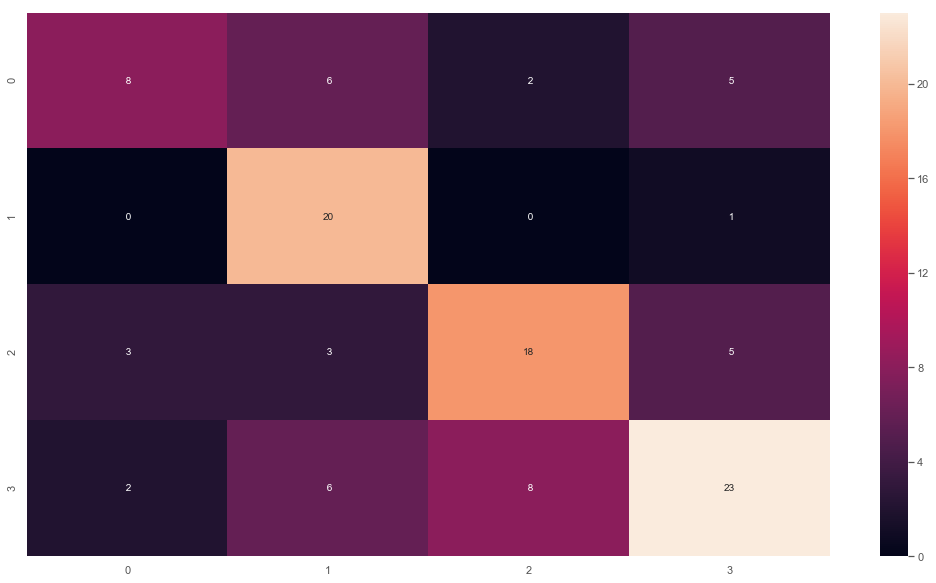

In [41]:
#random forest model
random_forest = RandomForestClassifier(n_estimators=1000)
random_forest.fit(X_train, Y_train)
Y_pred = random_forest.predict(X_test)
print(confusion_matrix(Y_test,Y_pred))
sns.heatmap(confusion_matrix(Y_test,Y_pred),annot=True,fmt='2.0f')
print(classification_report(Y_test,Y_pred))  
print(accuracy_score(Y_test, Y_pred))  

[[ 8  4  2  7]
 [ 0 19  1  1]
 [ 1  5 16  7]
 [ 3  5 11 20]]
              precision    recall  f1-score   support

      Brazil       0.67      0.38      0.48        21
    Colombia       0.58      0.90      0.70        21
   Guatemala       0.53      0.55      0.54        29
      Mexico       0.57      0.51      0.54        39

   micro avg       0.57      0.57      0.57       110
   macro avg       0.59      0.59      0.57       110
weighted avg       0.58      0.57      0.56       110

0.5727272727272728


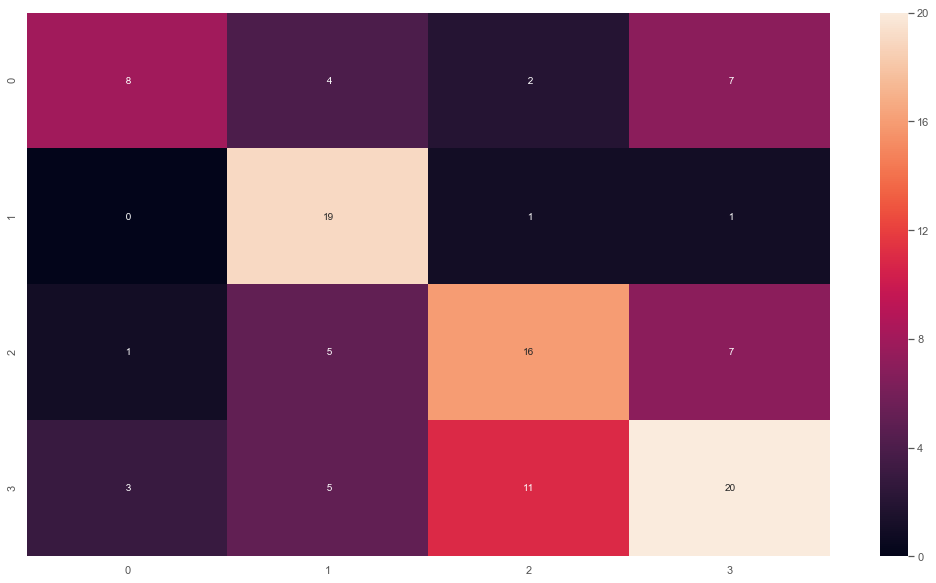

In [42]:
#gradient boosting model
gradient_boost = sklearn.ensemble.GradientBoostingClassifier(n_estimators=1000)
gradient_boost.fit(X_train, Y_train)
Y_pred = gradient_boost.predict(X_test)
print(confusion_matrix(Y_test,Y_pred)) 
sns.heatmap(confusion_matrix(Y_test,Y_pred),annot=True,fmt='2.0f')
print(classification_report(Y_test,Y_pred))  
print(accuracy_score(Y_test, Y_pred))  

In [58]:
#SVM
svclassifier = SVC(kernel = 'rbf')
svclassifier.fit(X_train, Y_train)
Y_pred = svclassifier.predict(X_test)
print(confusion_matrix(Y_test,Y_pred))  
print(classification_report(Y_test,Y_pred))  
print(accuracy_score(Y_test, Y_pred))  

[[ 4 10  1  8]
 [ 1 22  3  3]
 [ 1  2 15  7]
 [ 0  7  2 24]]
              precision    recall  f1-score   support

      Brazil       0.67      0.17      0.28        23
    Colombia       0.54      0.76      0.63        29
   Guatemala       0.71      0.60      0.65        25
      Mexico       0.57      0.73      0.64        33

   micro avg       0.59      0.59      0.59       110
   macro avg       0.62      0.56      0.55       110
weighted avg       0.61      0.59      0.56       110

0.5909090909090909


In [19]:
# Extract single tree
estimator = random_forest.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = x.columns.values,
                class_names = y.unique(),
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
import graphviz
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')